# ***FOOD DETECTION USING TENSORFLOW OBJECT DETECTION API***

---

# Installing Dependencies for Tensorflow Object Detection API

In [ ]:
#we will utilize the GPU in this tutorial. 
#TPU configuration is recommended for faster training on larger datsets
!pip install -U --pre tensorflow_gpu=="2.2.0"

     |████████████████████████████████| 516.2MB 33kB/s 


In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2800, done.
remote: Counting objects: 100% (2800/2800), done.
remote: Compressing objects: 100% (2433/2433), done.
remote: Total 2800 (delta 569), reused 1413 (delta 331), pack-reused 0
Receiving objects: 100% (2800/2800), 57.74 MiB | 33.36 MiB/s, done.
Resolving deltas: 100% (569/569), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1538872 sha256=bfbeb59d1ffd1ea19268c19c007addf66e6190672b3cdc9467b2880d6b4e3400
  Stored in directory: /tmp/pip-ephem-wheel-cache-_58mpfc7/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.8.1-cp36-none-any.whl size=43164 sha256=756b6fa3515fa1d10b61c78f39a4e2ddc88333f84ecbaac1ef5b12064a90d012
  Stored in directory: /root/.cache/pip/wheels/5c/04/3c/ffe3561c960133e747de503dea3e3facef2dea533bc92cb21a
  Created wheel for hdfs: filename=hdfs-2.5.8-cp36-none-any.whl size=33213 sha256=a92e607e2b4e58a2d3f3a33892afae8fdee38d31ea42134ff6c2ffe998395d92
  Stored in directory: /root/.cache/pip/wheels/fe/a7/05/23e3699975fc20f8a30e00ac1e515ab8c61168e982abe4ce70
  Created wheel for future: filename=future-0.18.2-cp36-none-any.whl size=491057 sha256=109de4cfcbf28e652f5ee639b82c5ba157723a2c6c2afef4a458366

ERROR: pydrive 1.3.1 has requirement oauth2client>=4.0.0, but you'll have oauth2client 3.0.0 which is incompatible.
ERROR: multiprocess 0.70.10 has requirement dill>=0.3.2, but you'll have dill 0.3.1.1 which is incompatible.


In [ ]:
#commence temporary keras fix for exporting efficientDet - this will inevitably be fixed and removed from the notebook in the coming days
%cat /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py

# Copyright 2018 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================
"""TensorFlow-related utilities."""
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import copy
import numpy as np
import six

from tensorflow.python.data.experimental.ops import cardinality
from tensorflow.python.eager import context
from tensorflo

In [ ]:
%%writefile /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py


#Roboflow: we are making a tiny change to the keras utils so we can export weights!

# Copyright 2018 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================
"""TensorFlow-related utilities."""
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import copy
import numpy as np
import six

from tensorflow.python.data.experimental.ops import cardinality
from tensorflow.python.eager import context
from tensorflow.python.framework import composite_tensor
from tensorflow.python.framework import ops
from tensorflow.python.framework import smart_cond as smart_module
from tensorflow.python.framework import tensor_shape
from tensorflow.python.framework import tensor_spec
from tensorflow.python.framework import tensor_util
from tensorflow.python.framework import type_spec
from tensorflow.python.keras import backend as K
from tensorflow.python.ops import control_flow_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.ops import variables
from tensorflow.python.util import nest
from tensorflow.python.util import object_identity
from tensorflow.python.util import tf_contextlib


def smart_cond(pred, true_fn=None, false_fn=None, name=None):
  """Return either `true_fn()` if predicate `pred` is true else `false_fn()`.

  If `pred` is a bool or has a constant value, we return either `true_fn()`
  or `false_fn()`, otherwise we use `tf.cond` to dynamically route to both.

  Arguments:
    pred: A scalar determining whether to return the result of `true_fn` or
      `false_fn`.
    true_fn: The callable to be performed if pred is true.
    false_fn: The callable to be performed if pred is false.
    name: Optional name prefix when using `tf.cond`.

  Returns:
    Tensors returned by the call to either `true_fn` or `false_fn`.

  Raises:
    TypeError: If `true_fn` or `false_fn` is not callable.
  """
  if isinstance(pred, variables.Variable):
    return control_flow_ops.cond(
        pred, true_fn=true_fn, false_fn=false_fn, name=name)
  return smart_module.smart_cond(
      pred, true_fn=true_fn, false_fn=false_fn, name=name)


def constant_value(pred):
  """Return the bool value for `pred`, or None if `pred` had a dynamic value.

  Arguments:
    pred: A scalar, either a Python bool or a TensorFlow boolean variable
      or tensor, or the Python integer 1 or 0.

  Returns:
    True or False if `pred` has a constant boolean value, None otherwise.

  Raises:
    TypeError: If `pred` is not a Variable, Tensor or bool, or Python
      integer 1 or 0.
  """
  # Allow integer booleans.
  if isinstance(pred, int):
    if pred == 1:
      pred = True
    elif pred == 0:
      pred = False

  if isinstance(pred, variables.Variable):
    return None
  return smart_module.smart_constant_value(pred)


def is_tensor_or_tensor_list(v):
  v = nest.flatten(v)
  if v and isinstance(v[0], ops.Tensor):
    return True
  else:
    return False


def get_reachable_from_inputs(inputs, targets=None):
  """Returns the set of tensors/ops reachable from `inputs`.

  Stops if all targets have been found (target is optional).

  Only valid in Symbolic mode, not Eager mode.

  Args:
    inputs: List of tensors.
    targets: List of tensors.

  Returns:
    A set of tensors reachable from the inputs (includes the inputs themselves).
  """
  inputs = nest.flatten(inputs, expand_composites=True)
  reachable = object_identity.ObjectIdentitySet(inputs)
  if targets:
    remaining_targets = object_identity.ObjectIdentitySet(nest.flatten(targets))
  queue = inputs[:]

  while queue:
    x = queue.pop()
    if isinstance(x, tuple(_user_convertible_tensor_types)):
      # Can't find consumers of user-specific types.
      continue

    if isinstance(x, ops.Operation):
      outputs = x.outputs[:] or []
      outputs += x._control_outputs  # pylint: disable=protected-access
    elif isinstance(x, variables.Variable):
      try:
        outputs = [x.op]
      except AttributeError:
        # Variables can be created in an Eager context.
        outputs = []
    elif tensor_util.is_tensor(x):
      outputs = x.consumers()
    else:
      if not isinstance(x, str):
        raise TypeError('Expected Operation, Variable, or Tensor, got ' + str(x))

    for y in outputs:
      if y not in reachable:
        reachable.add(y)
        if targets:
          remaining_targets.discard(y)
        queue.insert(0, y)

    if targets and not remaining_targets:
      return reachable

  return reachable


# This function needs access to private functions of `nest`.
#  pylint: disable=protected-access
def map_structure_with_atomic(is_atomic_fn, map_fn, nested):
  """Maps the atomic elements of a nested structure.

  Arguments:
    is_atomic_fn: A function that determines if an element of `nested` is
      atomic.
    map_fn: The function to apply to atomic elements of `nested`.
    nested: A nested structure.

  Returns:
    The nested structure, with atomic elements mapped according to `map_fn`.

  Raises:
    ValueError: If an element that is neither atomic nor a sequence is
      encountered.
  """
  if is_atomic_fn(nested):
    return map_fn(nested)

  # Recursively convert.
  if not nest.is_sequence(nested):
    raise ValueError(
        'Received non-atomic and non-sequence element: {}'.format(nested))
  if nest._is_mapping(nested):
    values = [nested[k] for k in nest._sorted(nested)]
  else:
    values = nested
  mapped_values = [
      map_structure_with_atomic(is_atomic_fn, map_fn, ele) for ele in values
  ]
  return nest._sequence_like(nested, mapped_values)


#  pylint: enable=protected-access


def convert_shapes(input_shape, to_tuples=True):
  """Converts nested shape representations to desired format.

  Performs:

  TensorShapes -> tuples if `to_tuples=True`.
  tuples of int or None -> TensorShapes if `to_tuples=False`.

  Valid objects to be converted are:
  - TensorShapes
  - tuples with elements of type int or None.
  - ints
  - None

  Arguments:
    input_shape: A nested structure of objects to be converted to TensorShapes.
    to_tuples: If `True`, converts all TensorShape to tuples. Otherwise converts
      all tuples representing shapes to TensorShapes.

  Returns:
    Nested structure of shapes in desired format.

  Raises:
    ValueError: when the input tensor shape can't be converted to tuples, eg
      unknown tensor shape.
  """

  def _is_shape_component(value):
    return value is None or isinstance(value, (int, tensor_shape.Dimension))
REFERENCE: [ROBOFLOW](https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD#scrollTo=IPbU4I7aL9Fl&uniqifier=1)
  def _is_atomic_shape(input_shape):
    # Ex: TensorShape or (None, 10, 32) or 5 or `None`
    if _is_shape_component(input_shape):
      return True
    if isinstance(input_shape, tensor_shape.TensorShape):
      return True
    if (isinstance(input_shape, (tuple, list)) and
        all(_is_shape_component(ele) for ele in input_shape)):
      return True
    return False

  def _convert_shape(input_shape):
    input_shape = tensor_shape.TensorShape(input_shape)
    if to_tuples:
      input_shape = tuple(input_shape.as_list())
    return input_shape

  return map_structure_with_atomic(_is_atomic_shape, _convert_shape,
                                   input_shape)
REFERENCE: [ROBOFLOW](https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD#scrollTo=IPbU4I7aL9Fl&uniqifier=1)

class ListWrapper(object):
  """A wrapper for lists to be treated as elements for `nest`."""

  def __init__(self, list_to_wrap):
    self._list = list_to_wrap

  def as_list(self):
    return self._list


def convert_inner_node_data(nested, wrap=False):
  """Either wraps or unwraps innermost node data lists in `ListWrapper` objects.

  Arguments:
    nested: A nested data structure.
    wrap: If `True`, wrap innermost lists in `ListWrapper` objects. If `False`,
      unwraps `ListWrapper` objects into lists.

  Returns:
    Structure of same type as nested, with lists wrapped/unwrapped.
  """

  def _is_serialized_node_data(nested):
    # Node data can be of form `[layer_name, node_id, tensor_id]` or
    # `[layer_name, node_id, tensor_id, kwargs]`.
    if (isinstance(nested, list) and (len(nested) in [3, 4]) and
        isinstance(nested[0], six.string_types)):
      return True
    return False

  def _is_atomic_nested(nested):
    """Returns `True` if `nested` is a list representing node data."""
    if isinstance(nested, ListWrapper):
      return True
    if _is_serialized_node_data(nested):
      return True
    return not nest.is_sequence(nested)

  def _convert_object_or_list(nested):
    """Convert b/t `ListWrapper` object and list representations."""
    if wrap:
      if isinstance(nested, ListWrapper):
        return nested
      if _is_serialized_node_data(nested):
        return ListWrapper(nested)
      return nested
    else:
      if isinstance(nested, ListWrapper):
        return nested.as_list()
      return nested

  return map_structure_with_atomic(_is_atomic_nested, _convert_object_or_list,
                                   nested)


def shape_type_conversion(fn):
  """Decorator that handles tuple/TensorShape conversion.

  Used in `compute_output_shape` and `build`.

  Arguments:
    fn: function to wrap.

  Returns:
    Wrapped function.
  """

  def wrapper(instance, input_shape):
    # Pass shapes as tuples to `fn`
    # This preserves compatibility with external Keras.
    if input_shape is not None:
      input_shape = convert_shapes(input_shape, to_tuples=True)
    output_shape = fn(instance, input_shape)
    # Return shapes from `fn` as TensorShapes.
    if output_shape is not None:
      output_shape = convert_shapes(output_shape, to_tuples=False)
    return output_shape

  return wrapper


def are_all_symbolic_tensors(tensors):
  return all(is_symbolic_tensor(tensor) for tensor in tensors)


_user_convertible_tensor_types = set()


def is_symbolic_tensor(tensor):
  """Returns whether a tensor is symbolic (from a TF graph) or an eager tensor.

  A Variable can be seen as either: it is considered symbolic
  when we are in a graph scope, and eager when we are in an eager scope.

  Arguments:
    tensor: A tensor instance to test.

  Returns:
    True for symbolic tensors, False for eager tensors.
  """
  if isinstance(tensor, tuple(_user_convertible_tensor_types)):
    tensor = ops.convert_to_tensor_or_composite(tensor)
  if isinstance(tensor, variables.Variable):
    # Variables that are output of a Keras Layer in Functional API mode
    # should be considered symbolic.
    # TODO(omalleyt): We need a better way to check this in order to
    # enable `run_eagerly=True` for Models containing Layers that
    # return Variables as outputs.
    return (getattr(tensor, '_keras_history', False) or
            not context.executing_eagerly())
  if isinstance(tensor, composite_tensor.CompositeTensor):
    component_tensors = nest.flatten(tensor, expand_composites=True)
    return any(hasattr(t, 'graph') for t in component_tensors)
  if isinstance(tensor, ops.Tensor):
    return hasattr(tensor, 'graph')
  return False


def register_symbolic_tensor_type(cls):
  """Allows users to specify types regarded as symbolic `Tensor`s.

  Used in conjunction with `tf.register_tensor_conversion_function`, calling
  `tf.keras.utils.register_symbolic_tensor_type(cls)` allows non-`Tensor`
  objects to be plumbed through Keras layers.

  Example:

  ```python
  # One-time setup.
  class Foo(object):
    def __init__(self, input_):
      self._input = input_
    def value(self):
      return tf.constant(42.)

  tf.register_tensor_conversion_function(
      Foo, lambda x, *args, **kwargs: x.value())

  tf.keras.utils.register_symbolic_tensor_type(Foo)

  # User-land.
  layer = tf.keras.layers.Lambda(lambda input_: Foo(input_))
  ```

  Arguments:
    cls: A `class` type which shall be regarded as a symbolic `Tensor`.
  """
  global _user_convertible_tensor_types
  _user_convertible_tensor_types.add(cls)


def type_spec_from_value(value):
  """Grab type_spec without converting array-likes to tensors."""
  if isinstance(value, composite_tensor.CompositeTensor):
    return value._type_spec  # pylint: disable=protected-access
  # Get a TensorSpec for array-like data without
  # converting the data to a Tensor
  if hasattr(value, 'shape') and hasattr(value, 'dtype'):
    return tensor_spec.TensorSpec(value.shape, value.dtype)
  else:
    return type_spec.type_spec_from_value(value)


def is_tensor_or_variable(x):
  return tensor_util.is_tensor(x) or isinstance(x, variables.Variable)


def assert_no_legacy_layers(layers):
  """Prevent tf.layers.Layers from being used with Keras.

  Certain legacy layers inherit from their keras analogs; however they are
  not supported with keras and can lead to subtle and hard to diagnose bugs.

  Args:
    layers: A list of layers to check

  Raises:
    TypeError: If any elements of layers are tf.layers.Layers
  """

  # isinstance check for tf.layers.Layer introduces a circular dependency.
  legacy_layers = [l for l in layers if getattr(l, '_is_legacy_layer', None)]
  if legacy_layers:
    layer_str = '\n'.join('  ' + str(l) for l in legacy_layers)
    raise TypeError(
        'The following are legacy tf.layers.Layers:\n{}\nTo use keras as a '
        'framework (for instance using the Network, Model, or Sequential '
        'classes), please use the tf.keras.layers implementation instead. '
        '(Or, if writing custom layers, subclass from tf.keras.layers rather '
        'than tf.layers)'.format(layer_str))


@tf_contextlib.contextmanager
def maybe_init_scope(layer):
  """Open an `init_scope` if in V2 mode and using the keras graph.

  Arguments:
    layer: The Layer/Model that is currently active.

  Yields:
    None
  """
  # Don't open an init_scope in V1 mode or when using legacy tf.layers.
  if (ops.executing_eagerly_outside_functions() and
      getattr(layer, '_keras_style', True)):
    with ops.init_scope():
      yield
  else:
    yield


@tf_contextlib.contextmanager
def graph_context_for_symbolic_tensors(*args, **kwargs):
  """Returns graph context manager if any of the inputs is a symbolic tensor."""
  if any(is_symbolic_tensor(v) for v in list(args) + list(kwargs.values())):
    with K.get_graph().as_default():
      yield
  else:
    yield


def dataset_is_infinite(dataset):
  """True if the passed dataset is infinite."""
  if ops.executing_eagerly_outside_functions():
    return math_ops.equal(
        cardinality.cardinality(dataset), cardinality.INFINITE)
  else:
    dataset_size = K.get_session().run(cardinality.cardinality(dataset))
    return dataset_size == cardinality.INFINITE


def get_tensor_spec(t, dynamic_batch=False, name=None):
  """Returns a `TensorSpec` given a single `Tensor` or `TensorSpec`."""
  if isinstance(t, type_spec.TypeSpec):
    spec = t
  elif isinstance(t, composite_tensor.CompositeTensor):
    # TODO(b/148821952): Should these specs have a name attr?
    spec = t._type_spec  # pylint: disable=protected-access
  elif hasattr(t, 'shape') and hasattr(t, 'dtype'):
    spec = tensor_spec.TensorSpec(shape=t.shape, dtype=t.dtype, name=name)
  else:
    return None  # Allow non-Tensors to pass through.

  if not dynamic_batch:
    return spec

  dynamic_batch_spec = copy.deepcopy(spec)
  # RaggedTensorSpec only has a private _shape.
  shape = dynamic_batch_spec._shape.as_list()  # pylint: disable=protected-access
  if shape:
    shape[0] = None
    dynamic_batch_spec._shape = tensor_shape.TensorShape(shape)  # pylint: disable=protected-access
  return dynamic_batch_spec


def to_numpy_or_python_type(tensors):
  """Converts a structure of `Tensor`s to `NumPy` arrays or Python scalar types.

  For each tensor, it calls `tensor.numpy()`. If the result is a scalar value,
  it converts it to a Python type, such as a float or int, by calling
  `result.item()`.

  Numpy scalars are converted, as Python types are often more convenient to deal
  with. This is especially useful for bfloat16 Numpy scalars, which don't
  support as many operations as other Numpy values.

  Args:
    tensors: A structure of tensors.

  Returns:
    `tensors`, but scalar tensors are converted to Python types and non-scalar
    tensors are converted to Numpy arrays.
  """
  def _to_single_numpy_or_python_type(t):
    if isinstance(t, ops.Tensor):
      x = t.numpy()
      return x.item() if np.ndim(x) == 0 else x
    return t  # Don't turn ragged or sparse tensors to NumPy.

  return nest.map_structure(_to_single_numpy_or_python_type, tensors)

Overwriting /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py


In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
import pandas as pd
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage
import csv

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-07-29 21:36:54.215957: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-07-29 21:36:54.278684: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-07-29 21:36:54.279361: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-07-29 21:36:54.279727: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-07-29 21:36:54.531143: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully o

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

# Generating TF Records

REFERENCES: [ROBOFLOW](https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD#scrollTo=IPbU4I7aL9Fl&uniqifier=1)

> I appreciate Roboflow for making the notebook available publicly
----
Now,
* to download images using google-images-download (use -u for urls)
* label them using labelImg
* convert xml to csv using [xml to csv](https://raw.githubusercontent.com/datitran/raccoon_dataset/master/xml_to_csv.py)
* generate tf record [tf record](https://raw.githubusercontent.com/datitran/raccoon_dataset/master/generate_tfrecord.py)
* edit config file from [config](https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/samples/configs/ssd_mobilenet_v1_pets.config)

----
For latest code and how to guide:<br>
[Tensorflow Object Detection API](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html)

In [ ]:
#downloading files
!wget 'https://drive.google.com/uc?export=download&id=1gCmRvnAWqUq1G-wfwF3lG-eRa0F2lXaG'
!mv 'uc?export=download&id=1gCmRvnAWqUq1G-wfwF3lG-eRa0F2lXaG' 'label.7z'

--2020-07-29 21:38:03--  https://drive.google.com/uc?export=download&id=1gCmRvnAWqUq1G-wfwF3lG-eRa0F2lXaG
Resolving drive.google.com (drive.google.com)... 74.125.195.102, 74.125.195.138, 74.125.195.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.195.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vrqfk23hon4t7dmvldg421kmnn7kd1g7/1596058650000/01247926446764238492/*/1gCmRvnAWqUq1G-wfwF3lG-eRa0F2lXaG?e=download [following]
--2020-07-29 21:38:11--  https://doc-10-2o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vrqfk23hon4t7dmvldg421kmnn7kd1g7/1596058650000/01247926446764238492/*/1gCmRvnAWqUq1G-wfwF3lG-eRa0F2lXaG?e=download
Resolving doc-10-2o-docs.googleusercontent.com (doc-10-2o-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting to doc-10-2o-docs.googleusercontent.com (doc-10

In [ ]:
!ls

label.7z  models  sample_data


In [ ]:
!7z x label.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 86863328 bytes (83 MiB)

Extracting archive: label.7z
--
Path = label.7z
Type = 7z
Physical Size = 86863328
Headers Size = 8767
Method = LZMA2:24
Solid = +
Blocks = 1

  0%     11% 65 - label/train/15.Hainanese_Curry_Rice_by_Banej.jpg                                                           17% 101 - label/train/316167_2200-1200x628.jpg                                                33% 149 - label/train/8.sprigandvine-korean-curry-rice-3.jpg

In [ ]:
for dir in os.listdir('label'):
    image_path = os.path.join('label',dir)
    print(image_path)

label/train
label/test


In [ ]:
%mkdir data

In [ ]:
import xml.etree.ElementTree as ET

def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def main():
    for dir in os.listdir('label'):
        image_path = os.path.join('label',dir)
        xml_df = xml_to_csv(image_path)
        xml_df.to_csv('data/{}labels.csv'.format(dir), index=None)
        print('Successfully converted xml to csv.')

main()

Successfully converted xml to csv.
Successfully converted xml to csv.


In [ ]:
os.listdir('data')

['testlabels.csv', 'trainlabels.csv']

In [ ]:
#take a peak
df = pd.read_csv('data/trainlabels.csv')
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image19.jpeg,259,194,roti,22,13,226,184
1,134835728.jpg,1500,1121,rice,5,41,456,348
2,134835728.jpg,1500,1121,roti,531,61,1267,335
3,134835728.jpg,1500,1121,egg,401,365,639,561
4,134835728.jpg,1500,1121,egg,652,383,890,579


In [ ]:
%%writefile generate_tfrecord.py

"""
Usage:

# Create train data:
python generate_tfrecord.py --label=<LABEL> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/train_labels.csv  --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/train.record

# Create test data:
python generate_tfrecord.py --label=<LABEL> --csv_input=<PATH_TO_ANNOTATIONS_FOLDER>/test_labels.csv  --output_path=<PATH_TO_ANNOTATIONS_FOLDER>/test.record
"""

from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow.compat.v1 as tf
import sys
sys.path.append("../../models/research")

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict,defaultdict

flags = tf.app.flags
flags.DEFINE_string('csv_input', '', 'Path to the CSV input')
flags.DEFINE_string('output_path', '', 'Path to output TFRecord')

# if one label
# flags.DEFINE_string('label', '', 'Name of class label.eg:ship')

# if your image has more labels input them as
# flags.DEFINE_string('label0', '', 'Name of class[0] label')
# flags.DEFINE_string('label1', '', 'Name of class[1] label')
# and so on.

flags.DEFINE_string('label1', '', 'egg')
flags.DEFINE_string('label2', '', 'roti')
flags.DEFINE_string('label3', '', 'rice')
flags.DEFINE_string('label4', '', 'curry')

flags.DEFINE_string('img_path', '', 'Path to images')
FLAGS = flags.FLAGS


# TO-DO replace this with label map
# for multiple labels add more else if statements

class ReturnNoneException(Exception):
    def __init__(self,filename):
        super().__init__(f'{filename} return None as class Index')

def class_text_to_int(row_label):

    # if only one label
    # if row_label == FLAGS.label:  # 'ship':
    #     return 1
    # comment upper if statement and uncomment these statements for multiple labelling
    # if row_label == FLAGS.label0:
    #   return 1
    # elif row_label == FLAGS.label1:
    #   return 0

    #0 is for background
    label_count[row_label] += 1
    if row_label == FLAGS.label1:
      return 1
    elif row_label == FLAGS.label2:
      return 2
    elif row_label == FLAGS.label3:
      return 3
    elif row_label == FLAGS.label4:
      return 4
    else:
      return None


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    # check if the image format is matching with your images.
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        cls = class_text_to_int(row['class'])
        if cls !=None:
            classes.append(cls)
        else:
            raise ReturnNoneException(filename)

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example


def main(_):
    writer = tf.python_io.TFRecordWriter(FLAGS.output_path)
    path = os.path.join(os.getcwd(), FLAGS.img_path)
    examples = pd.read_csv(FLAGS.csv_input)
    grouped = split(examples, 'filename')
    for group in grouped:
        tf_example = create_tf_example(group, path)
        writer.write(tf_example.SerializeToString())

    writer.close()
    output_path = os.path.join(os.getcwd(), FLAGS.output_path)
    print('Successfully created the TFRecords: {}'.format(output_path))
    print("Count: ",label_count)

label_count = defaultdict(int)

if __name__ == '__main__':
    tf.app.run()


Writing generate_tfrecord.py


In [ ]:
!python3 generate_tfrecord.py --label1='egg' --label2='roti' --label3='rice' --label4='curry' --csv_input=data/trainlabels.csv  --output_path=data/train.record --img_path=label/train

Successfully created the TFRecords: /content/data/train.record
Count:  defaultdict(<class 'int'>, {'rice': 133, 'roti': 111, 'curry': 114, 'egg': 195})


In [ ]:
!python3 generate_tfrecord.py --label1='egg' --label2='roti' --label3='rice' --label4='curry' --csv_input=data/testlabels.csv  --output_path=data/test.record --img_path=label/test

Successfully created the TFRecords: /content/data/test.record
Count:  defaultdict(<class 'int'>, {'rice': 4, 'curry': 5, 'egg': 15, 'roti': 2})


In [ ]:
%%writefile /content/data/object-detection.pbtxt
item {
    id: 1
    name: 'egg'
}

item{
    id:2
    name:'roti'
}

item{
    id:3
    name:'rice'
}

item{
    id:4
    name:'curry'
}

Writing /content/data/object-detection.pbtxt


In [ ]:
test_record_fname = '/content/data/train.record'
train_record_fname = '/content/data/test.record'
label_map_pbtxt_fname = '/content/data/object-detection.pbtxt'

In [ ]:
##change chosen model to deploy different models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 16
    }
}

#in this tutorial we implement the lightweight, smallest state of the art efficientdet model
#if you want to scale up tot larger efficientdet models you will likely need more compute!
chosen_model = 'efficientdet-d0'

num_steps = 2000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing. 
num_eval_steps = 200 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
#if you can fit a large batch in memory, it may speed up your training(16 dint fit so used 12 directly)
# batch_size = MODELS_CONFIG[chosen_model]['batch_size']
batch_size = 12

In [ ]:
#download pretrained weights
%mkdir /content/models/research/deploy/
%cd /content/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/models/research/deploy
--2020-07-29 21:40:09--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.20.128, 2607:f8b0:400e:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.20.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  --.-KB/s    in 0.09s   

2020-07-29 21:40:09 (311 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [ ]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/research/deploy
--2020-07-29 21:40:24--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2020-07-29 21:40:25 (62.5 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [ ]:
#prepare
pipeline_fname = '/content/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)

In [ ]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /content/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)



/content/models/research/deploy
writing custom configuration file


In [ ]:
%cat /content/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [ ]:
pipeline_file = '/content/models/research/deploy/pipeline_file.config'
model_dir = '/content/training/'

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2020-07-29 21:40:57.812782: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-07-29 21:40:57.849989: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-07-29 21:40:57.850661: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-07-29 21:40:57.850972: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-07-29 21:40:57.852902: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2020-07-29 21:40:57.854633: I tensorflow/stream_executor/platform/default/d

# Training

In [ ]:
#run model evaluation to obtain performance metrics
#!python /content/models/research/object_detection/model_main_tf2.py \
    #--pipeline_config_path={pipeline_file} \
    #--model_dir={model_dir} \
    #--checkpoint_dir={model_dir} \
#Not yet implemented for EfficientDet

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [ ]:
#see where our model saved weights
%ls '/content/training/'

checkpoint                  ckpt-2.index
ckpt-1.data-00000-of-00002  ckpt-3.data-00000-of-00002
ckpt-1.data-00001-of-00002  ckpt-3.data-00001-of-00002
ckpt-1.index                ckpt-3.index
ckpt-2.data-00000-of-00002  train/
ckpt-2.data-00001-of-00002


In [ ]:
#run conversion script
import re
import numpy as np

output_directory = '/content/fine_tuned_model'

#place the model weights you would like to export here
last_model_path = '/content/training/'
print(last_model_path)
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/content/training/
I0729 22:21:18.971607 140546689484672 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet EfficientNet backbone version: efficientnet-b0
I0729 22:21:18.971778 140546689484672 ssd_efficientnet_bifpn_feature_extractor.py:145] EfficientDet BiFPN num filters: 64
I0729 22:21:18.971856 140546689484672 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num iterations: 3
I0729 22:21:18.981112 140546689484672 efficientnet_model.py:146] round_filter input=32 output=32
2020-07-29 22:21:18.989899: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-07-29 22:21:19.030484: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-07-29 22:21:19.031026: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 00

In [ ]:
%ls '/content/fine_tuned_model/saved_model/'

assets/  saved_model.pb  variables/


# Prediction

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
%ls '/content/training/'

checkpoint                  ckpt-2.index
ckpt-1.data-00000-of-00002  ckpt-3.data-00000-of-00002
ckpt-1.data-00001-of-00002  ckpt-3.data-00001-of-00002
ckpt-1.index                ckpt-3.index
ckpt-2.data-00000-of-00002  train/
ckpt-2.data-00001-of-00002


In [ ]:
#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = '/content/training/ckpt-3'
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(model_dir))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [ ]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

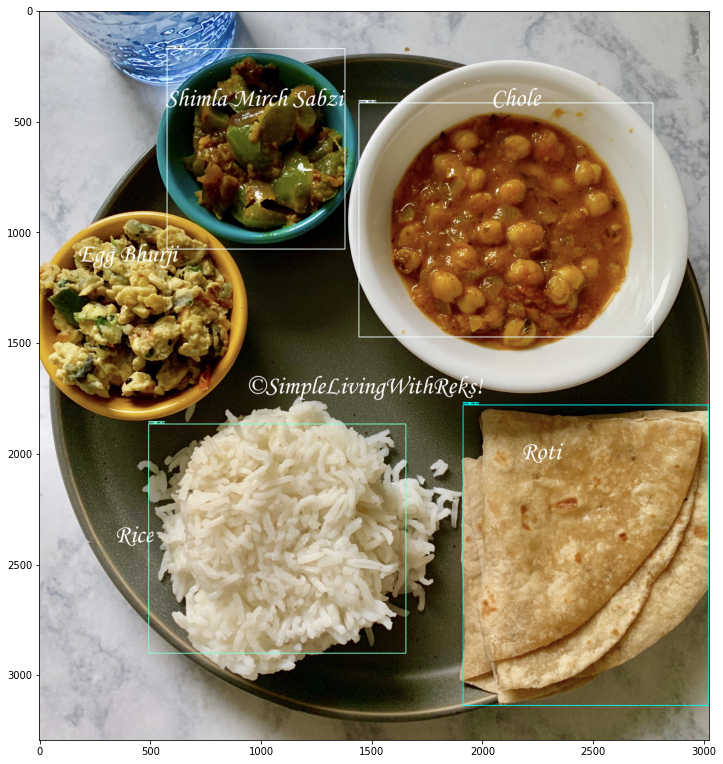

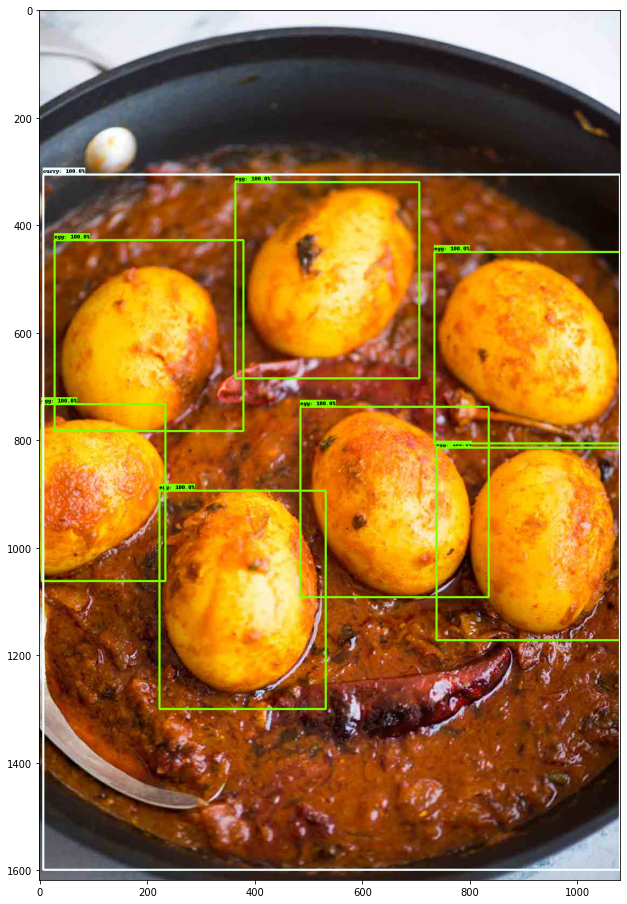

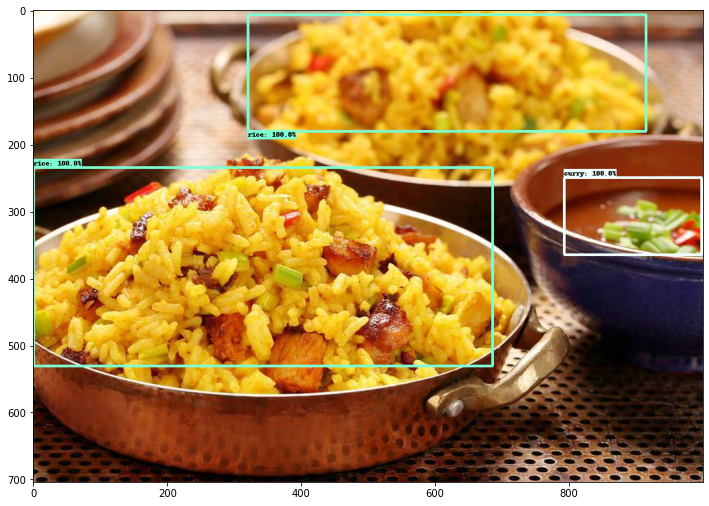

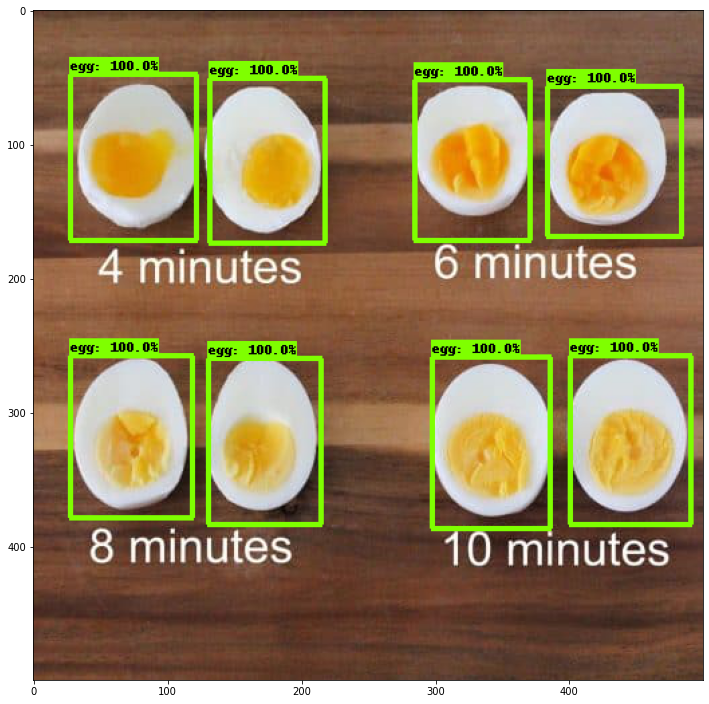

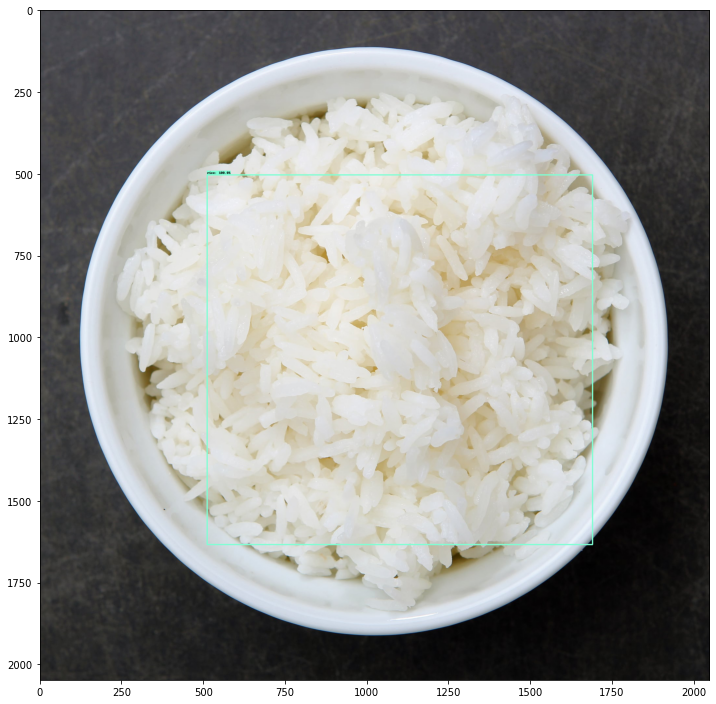

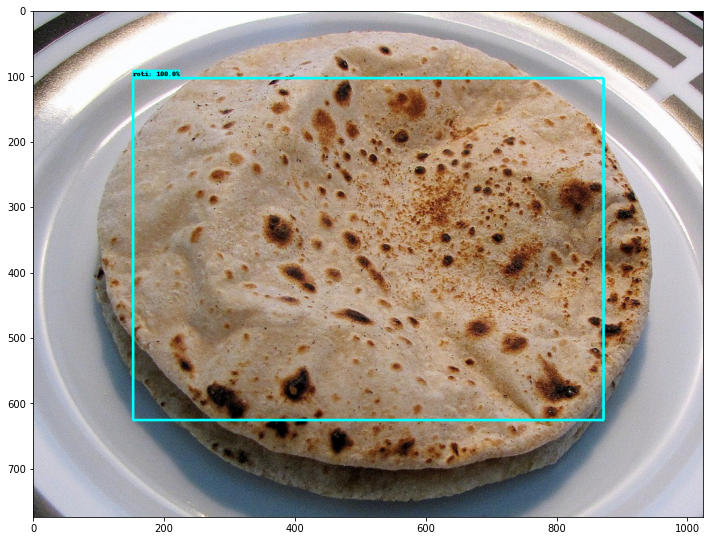

In [ ]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed. 
import random

TEST_IMAGE_PATHS = glob.glob('/content/label/test/*.jpg')
# image_path = random.choice(TEST_IMAGE_PATHS)
for image_path in TEST_IMAGE_PATHS:
    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    input_tensor = tf.convert_to_tensor(
        np.expand_dims(image_np, 0), dtype=tf.float32)
    detections, predictions_dict, shapes = detect_fn(input_tensor)

    label_id_offset = 1
    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.75,
        agnostic_mode=False,
    )

    plt.figure(figsize=(12,16))
    plt.imshow(image_np_with_detections)
    plt.show()

# Downloading the Model

In [ ]:
model = tf.saved_model.load('/content/fine_tuned_model/saved_model')
model

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x7fc33e4d5e10>

In [ ]:
# !pip install tensorflowjs

     |████████████████████████████████| 61kB 3.1MB/s 
     |████████████████████████████████| 92kB 7.7MB/s 
     |████████████████████████████████| 137.3MB 110kB/s 
     |████████████████████████████████| 6.8MB 55.7MB/s 
     |████████████████████████████████| 460kB 50.7MB/s 
     |████████████████████████████████| 256kB 57.7MB/s 
     |████████████████████████████████| 921kB 50.8MB/s 
  Created wheel for PyInquirer: filename=PyInquirer-1.0.3-cp36-none-any.whl size=32851 sha256=55c3cb3e13990a89ca9ff08c8d508dfa5278707748f33fa30fbb5a1086fc05d0
  Stored in directory: /root/.cache/pip/wheels/52/6c/b1/3e4b0e8daf42a92883c7641c0ea8ffb62e0490ebed2faa55ad
Successfully built PyInquirer
ERROR: tensorflow 2.2.0 has requirement tensorboard<2.3.0,>=2.2.0, but you'll have tensorboard 2.3.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement tensorflow-estimator<2.3.0,>=2.2.0, but you'll have tensorflow-estimator 2.3.0 which is incompatible.
ERROR: tensorflow-gpu 2.2.0 has requirement tenso

In [ ]:
# %%bash
# tensorflowjs_converter \
#     --input_format=tf_saved_model \
#     --output_format=tfjs_graph_model \
#     --signature_name=serving_default \
#     --output_node_names='food_detection' \
#     --saved_model_tags=serve \
#     /content/fine_tuned_model/saved_model \
#     /content/fine_tuned_model/web_model

Writing weight file /content/fine_tuned_model/web_model/model.json...


2020-07-29 22:25:50.050983: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2020-07-29 22:25:50.054614: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2200000000 Hz
2020-07-29 22:25:50.054835: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x10974140 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-07-29 22:25:50.054862: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2020-07-29 22:26:09.678330: I tensorflow/core/grappler/devices.cc:78] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0 (Note: TensorFlow was not compiled with CUDA or ROCm support)
2020-07-29 22:26:09.6

In [ ]:
# !7z a 'webmodel.7z' '/content/fine_tuned_model/web_model'


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive:
  0M Scan  /content/fine_tuned_model/                                     1 folder, 6 files, 17764555 bytes (17 MiB)

Creating archive: webmodel.7z

Items to compress: 7

  0%      9% + web_model/group1-shard1of5.bin                                      17% + web_model/group1-shard1of5.bin                                      24% 1 + web_model/group1-shard2of5.bin                                        30% 1 + web_model/group1-shard2of5.bin

In [ ]:
!7z a 'savedmodel.7z' '/content/fine_tuned_model/saved_model'


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive:
  0M Scan  /content/fine_tuned_model/                                     3 folders, 4 files, 44797350 bytes (43 MiB)

Creating archive: savedmodel.7z

Items to compress: 7

  0%      2% + saved_model/saved_model.pb                                   7% + saved_model/saved_model.pb                                  11% + saved_model/saved_model.pb                                  16% + saved_model/saved_model.pb                                 

In [ ]:
from google.colab import files

In [ ]:
files.download('savedmodel.7z')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# files.download('webmodel.7z')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !7z a 'ckpt.7z' '/content/training'


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive:
  0M Scan  /content/                    2 folders, 11 files, 976375368 bytes (932 MiB)

Creating archive: ckpt.7z

Items to compress: 13

  0%      0% 2 + training/ckpt-1.data-00001-of-00002                                              1% 2 + training/ckpt-1.data-00001-of-00002                                              2% 2 + training/ckpt-1.data-00001-of-00002                                              2% 5 + training/ckpt-2.data-00001-of-00002

In [ ]:
# files.download('ckpt.7z')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# files.download('/content/models/research/deploy/pipeline_file.config')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>